In [2]:
#importing some useful packages
import numpy as np
import cv2
import pickle
import math
import time
from datetime import datetime
from PIL import Image

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline


In [4]:
# Load the camera calibration matrix from the pickle file.
def get_camera_calibration():
    calibration_pickle = pickle.load( open( "./camera_cal/camera-calibration.p", "rb" ) )

    mtx = calibration_pickle["mtx"]
    dist = calibration_pickle["dist"]
    return mtx, dist

In [5]:
def plot_original_and_newImage(original, new, new_title="New Image", destCmap='gray'):
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(original, destCmap)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(new, destCmap)
    ax2.set_title(new_title, fontsize=30)

In [6]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

In [7]:
# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

In [8]:
# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

In [9]:
# Define a function that thresholds the S-channel of HLS
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

In [91]:
def pre_process_image(img):
    
    ksize = 15
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(img, orient='x', thresh=(5, 100))
    grady = abs_sobel_thresh(img, orient='y', thresh=(5, 100))
    mag_binary = mag_thresh(img, sobel_kernel=ksize, mag_thresh=(10, 100))
    dir_binary = dir_threshold(img, sobel_kernel=ksize, thresh=(0.7,1.3))

    combined_binary = np.zeros_like(dir_binary)
    combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

    s_binary = hls_select(img, thresh=(128, 255))
    
    full_combined_binary = np.zeros_like(s_binary)
    #full_combined_binary[((((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))) & (s_binary == 1))] = 1

    full_combined_binary[((combined_binary == 1) & (s_binary == 1))] = 1
    return full_combined_binary

In [38]:
# Image dimentions (720, 1280, 3)
def draw_poly(img):
    imshape = img.shape
    yMax = (imshape)[0]
    color = [0,255,0]
    new_image = img.copy()
    #cv2.line(new_image, (180, yMax), (580, 450), color, 10)
    #cv2.line(new_image, (580, 450), (710, 450), color, 10)
    #cv2.line(new_image, (710, 450), (1150, yMax), color, 10)
    
    #cv2.line(new_image, (300, 661), (560, 476), color, 10)
    #cv2.line(new_image, (560, 476), (734, 476), color, 10)
    #cv2.line(new_image, (734, 476), (1010, 656), color, 10)
    
    cv2.line(new_image, (300, 661), (560, 476), color, 10)
    cv2.line(new_image, (560, 476), (754, 476), color, 10)
    cv2.line(new_image, (754, 476), (1100, 656), color, 10)
    return new_image

In [39]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [40]:
def region_of_not_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image "NOT" defined by the polygon
    formed from `vertices`. Image inside the Polygon is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   

    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    mask2 = cv2.bitwise_not(mask)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask2)
    return masked_image

In [41]:
def apply_perspective(img, grayscale='false'):
    
    if grayscale == 'true':
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    img_size = (img.shape[1], img.shape[0])
    yMax = (img_size)[0]

    """
    #This time we are defining a four sided polygon to mask
    imshape = image.shape

    # Adjusting the co-ordinates according to the resolution of the image
    x0Vertice1 = math.ceil((120/960)*imshape[1])
    x1Vertice1 = math.ceil((445/960)*imshape[1])
    x2Vertice1 = math.ceil((520/960)*imshape[1])
    yVertice1 = math.ceil((325/540)*imshape[0])
    
    #vertices1 = np.array([[(x0Vertice1,imshape[0]),(x1Vertice1, yVertice1), (x2Vertice1, yVertice1), (imshape[1],imshape[0])]], dtype=np.int32)
    #src =  np.float32([[(x0Vertice1,imshape[0]),(x1Vertice1, yVertice1), (x2Vertice1, yVertice1), (imshape[1],imshape[0])]])

    """
    """
    src = np.float32([[300, 661], [560, 476], [734, 476], [1010, 656]])
    dst = np.float32([[offset, yMax], 
                      [offset, 0],
                      [offset+400, 0],
                      [offset+400, yMax]])
    """

    src = np.float32([[300, 661], [560, 476], [734, 476], [1010, 656]])

    #src = np.float32([[300, 1000], [360, 476], [534, 476], [1010, 1000]])
    #src = np.float32([[100, 1000], [160, 476], [734, 476], [1010, 1000]])
    
    offset = 300
    dst = np.float32([[offset, 720], 
                      [offset, 0],
                      [offset+400, 0],
                      [offset+400, 720]])

    # d) use cv2.getPerspectiveTransform() to get M, the transform matrix
    #M = cv2.getPerspectiveTransform(PERSPECTIVE_SRC, PERSPECTIVE_DST)
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    # e) use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
            
    #delete the next two lines
    #M = None
    #warped = np.copy(img) 
    return warped, M, Minv

In [42]:
def get_real_world_angles_from_points(leftx, lefty, rightx, righty):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    y_eval = np.max(ploty)
    #print("leftx= ", leftx.shape)
    #print("ploty= ", ploty.shape)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    return left_curverad, right_curverad

In [98]:
def fit_poly(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    arg_max_left = np.argmax(histogram[:midpoint])
    arg_max_right = np.argmax(histogram[midpoint:])
    
    if arg_max_left <=40 or arg_max_right<=40:
        print("arg_max_left=", arg_max_left, "arg_max_right=", arg_max_right)
        return
    
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    #print("leftx_base=", leftx_base, ", rightx_base=",rightx_base)
        
    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    left_curverad, right_curverad = get_real_world_angles_from_points(leftx, lefty, rightx, righty)
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    return (left_curverad, right_curverad, left_fit, right_fit, out_img, left_lane_inds, right_lane_inds)

In [44]:
def unwarp_image(img, warped_bin, Minv, left_fitx, right_fitx, ploty):

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_bin).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    return result

In [99]:
def process_clip(clip_image):
    
    """
    currDT = datetime.now().strftime('%Y-%m-%d-%H-%M-%s')
    fileName = './out_images/pic_' + currDT + '_in.png' 
    im = Image.fromarray(clip_image)
    im.save(fileName)
    """
    
    mtx, dist = get_camera_calibration()
    undist_binary = cv2.undistort(clip_image, mtx, dist, None, mtx)
    
    s_binary = hls_select(undist_binary, thresh=(128, 255))

    final_binary = s_binary #pre_process_image(undist_binary)
    
    #image_with_poly = draw_poly(clip_image)

    #This time we are defining a four sided polygon to mask
    imshape = clip_image.shape

    # Adjusting the co-ordinates according to the resolution of the image
    x0Vertice1 = math.ceil((120/960)*imshape[1])
    x1Vertice1 = math.ceil((445/960)*imshape[1])
    x2Vertice1 = math.ceil((520/960)*imshape[1])
    yVertice1 = math.ceil((325/540)*imshape[0])

    vertices1 = np.array([[(x0Vertice1,imshape[0]),(x1Vertice1, yVertice1), (x2Vertice1, yVertice1), (imshape[1],imshape[0])]], dtype=np.int32)
    masked_image = region_of_interest(final_binary, vertices1)
    
    x0Vertice2 = math.ceil((250/960)*imshape[1])
    x1Vertice2 = math.ceil((475/960)*imshape[1])
    x2Vertice2 = math.ceil((490/960)*imshape[1])
    yVertice2 = math.ceil((380/540)*imshape[0])
    xnVertice2 = math.ceil((140/960)*imshape[1])

    vertices2 = np.array([[(x0Vertice2,imshape[0]),(x1Vertice2, yVertice2), (x2Vertice2, yVertice2), (imshape[1]-xnVertice2,imshape[0])]], dtype=np.int32)
    masked_image = region_of_not_interest(masked_image, vertices2)
    
    binary_warped, M, Minv = apply_perspective(masked_image)
    return_poly = fit_poly(binary_warped)

    if return_poly == None:
        print("No Object Returned")
        right_curverad = None
        left_fit = None
        right_fit = None
        out_img = None
        left_lane_inds = None
        right_lane_inds = None
        
        plot_original_and_newImage(image, binary_warped, 'Perspective Warped')
        histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
        plt.plot(histogram)
        return clip_image
    else:
        left_curverad = return_poly[0]
        right_curverad = return_poly[1]
        left_fit = return_poly[2]
        right_fit = return_poly[3]
        out_img = return_poly[4]
        left_lane_inds = return_poly[5]
        right_lane_inds = return_poly[6]
     
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    unwarpped_image = unwarp_image(clip_image, binary_warped, Minv, left_fitx, right_fitx, ploty)
    
    """
    outFileName = './out_images/pic_' + currDT + '_out.png' 
    im = Image.fromarray(unwarpped_image)
    im.save(outFileName)
    """
    
    return unwarpped_image

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


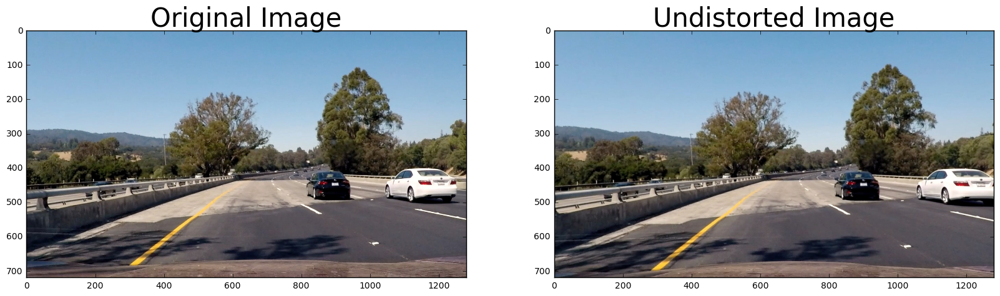

In [46]:
#reading in an image
#image = mpimg.imread('test_images/straight_lines1.jpg')
#image = mpimg.imread('test_images/straight_lines2.jpg')
image = mpimg.imread('test_images/test4.jpg')
#image = mpimg.imread('test_images/pic_2017-03-19-02-04-1489914263_in.png')
#printing out some stats and plotting
print('This image is:', type(image), 'with dimesions:', image.shape)
image_original = image

mtx, dist = get_camera_calibration()
image = cv2.undistort(image_original, mtx, dist, None, mtx)

# Visualize undistortion
plot_original_and_newImage(image_original, image, 'Undistorted Image')

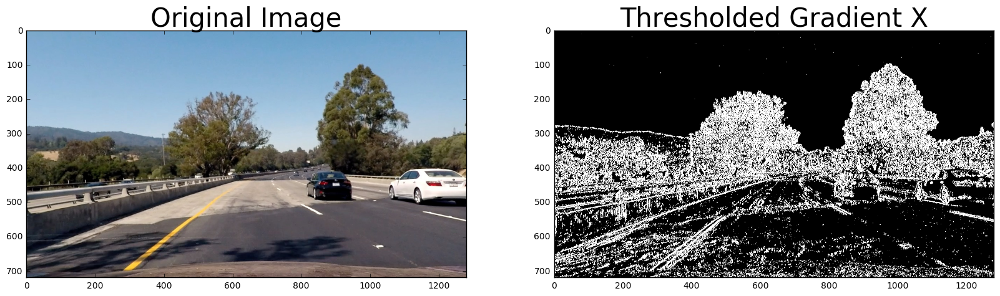

In [64]:
# Run the function
grad_binary = abs_sobel_thresh(image, orient='x', thresh=(5,100))

# Visualize undistortion
plot_original_and_newImage(image, grad_binary, 'Thresholded Gradient X')


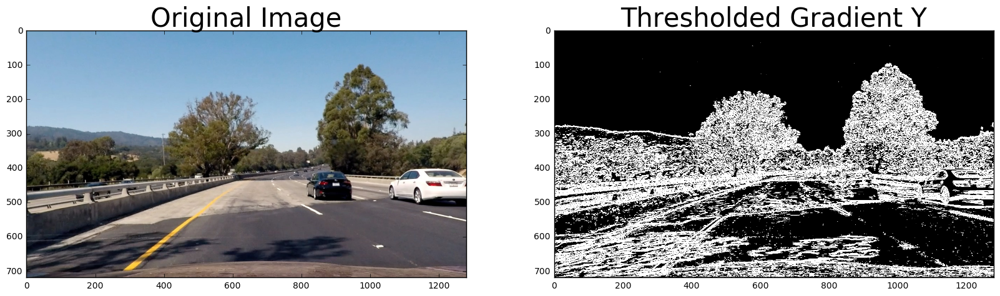

In [65]:
# Run the function
grad_binary = abs_sobel_thresh(image, orient='y', thresh=(5,200))

# Visualize undistortion
plot_original_and_newImage(image, grad_binary, 'Thresholded Gradient Y')



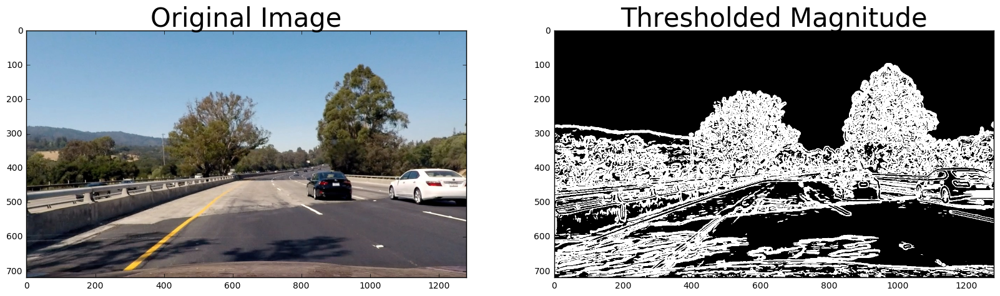

In [66]:
# Run the function
mag_binary = mag_thresh(image, sobel_kernel=15, mag_thresh=(10, 100))

# Visualize
plot_original_and_newImage(image, mag_binary, 'Thresholded Magnitude')

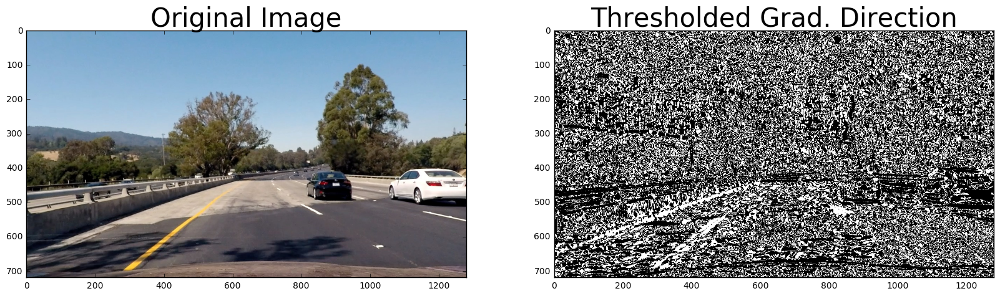

In [67]:
# Run the function
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))

# Visualize
plot_original_and_newImage(image, dir_binary, 'Thresholded Grad. Direction')

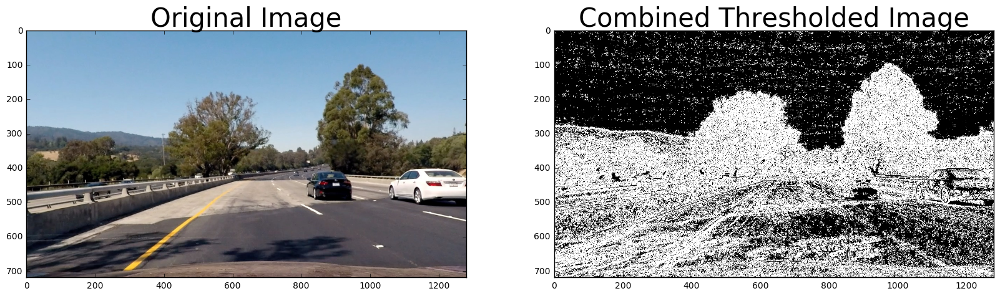

In [68]:
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

# Apply each of the thresholding functions
gradx = abs_sobel_thresh(image, orient='x', thresh=(1, 100))
grady = abs_sobel_thresh(image, orient='y', thresh=(1, 100))
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7,1.3))

combined_binary = np.zeros_like(dir_binary)
combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

# Visualize
plot_original_and_newImage(image, combined_binary, 'Combined Thresholded Image')

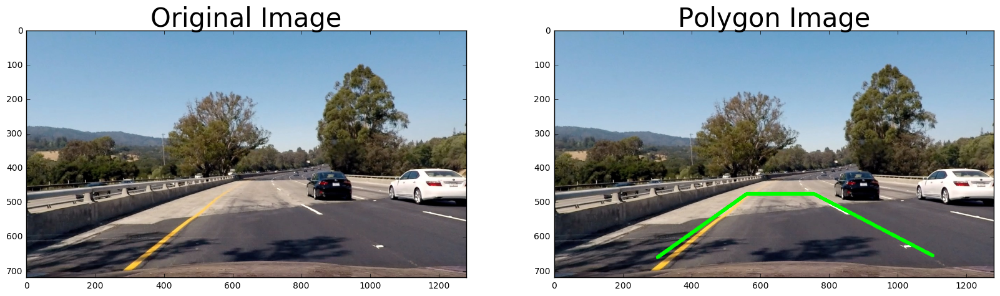

In [69]:
image_with_poly = draw_poly(image)

# Visualize
plot_original_and_newImage(image, image_with_poly, 'Polygon Image')

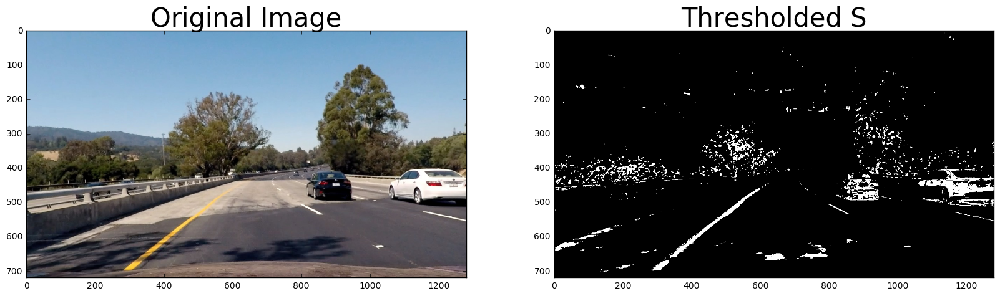

In [81]:
s_binary = hls_select(image, thresh=(128, 255))

#hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
#s_channel = hls[:,:,2]
#binary_output = np.zeros_like(s_channel)
#binary_output[(s_channel > 0.5) & (s_channel <= 1)] = 1
#print(np.max(s_channel))
# Visualize
plot_original_and_newImage(image, s_binary, 'Thresholded S')

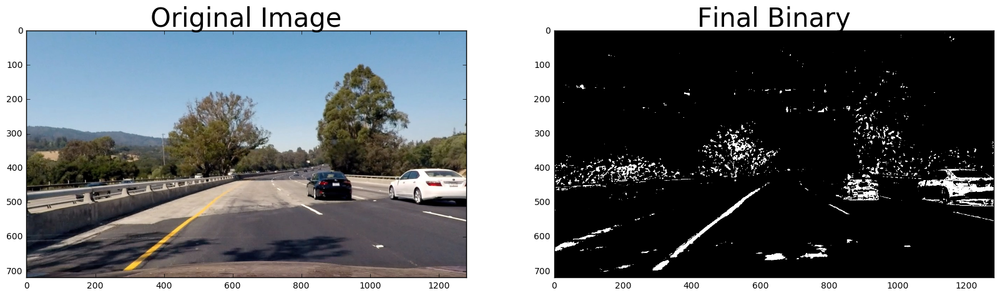

In [83]:
full_combined_binary = np.zeros_like(s_binary)
#full_combined_binary[((((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))) & (s_binary == 1))] = 1

full_combined_binary[((combined_binary == 1) & (s_binary == 1))] = 1

## FIXME: Remove the assignment and use the actual image
full_combined_binary = s_binary

# Visualize
plot_original_and_newImage(image, full_combined_binary, 'Final Binary')



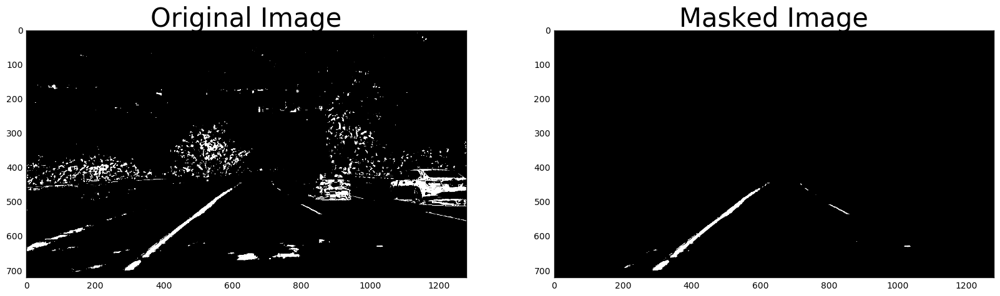

In [84]:
#vertices = np.array([[(300, 661)], [(560, 476)], [(734, 476)], [(1010, 656)]], dtype=np.int32)
#vertices1 = np.array([[(0, image.shape[0])], [(0, 0)], [(image.shape[1], 0)], [(image.shape[1], image.shape[0])]], dtype=np.int32)

#This time we are defining a four sided polygon to mask
imshape = image.shape

# Image dimentions (720, 1280, 3)

# Adjusting the co-ordinates according to the resolution of the image
x0Vertice1 = math.ceil((120/960)*imshape[1])
x1Vertice1 = math.ceil((445/960)*imshape[1])
x2Vertice1 = math.ceil((520/960)*imshape[1])
yVertice1 = math.ceil((325/540)*imshape[0])

vertices1 = np.array([[(x0Vertice1,imshape[0]),(x1Vertice1, yVertice1), (x2Vertice1, yVertice1), (imshape[1],imshape[0])]], dtype=np.int32)

#gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
masked_image = region_of_interest(full_combined_binary, vertices1)

x0Vertice2 = math.ceil((250/960)*imshape[1])
x1Vertice2 = math.ceil((475/960)*imshape[1])
x2Vertice2 = math.ceil((490/960)*imshape[1])
yVertice2 = math.ceil((380/540)*imshape[0])
xnVertice2 = math.ceil((140/960)*imshape[1])

vertices2 = np.array([[(x0Vertice2,imshape[0]),(x1Vertice2, yVertice2), (x2Vertice2, yVertice2), (imshape[1]-xnVertice2,imshape[0])]], dtype=np.int32)
masked_image = region_of_not_interest(masked_image, vertices2)

# Visualize
plot_original_and_newImage(full_combined_binary, masked_image, 'Masked Image')

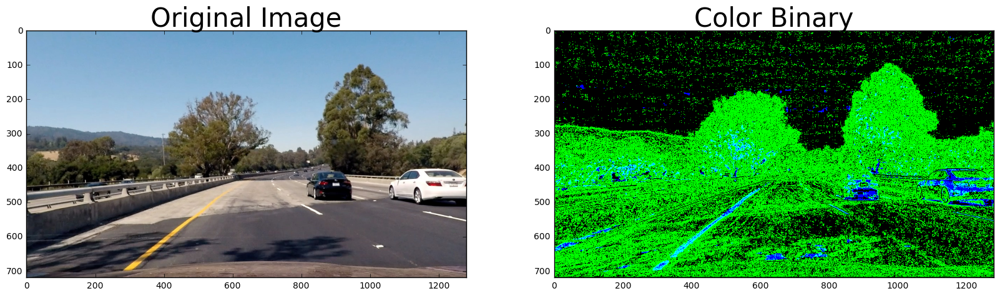

In [85]:
# Stack each channel to view their individual contributions in green and blue respectively
# This returns a stack of the two binary images, whose components you can see as different colors
color_binary = np.dstack(( np.zeros_like(combined_binary), combined_binary, s_binary))

# Visualize
plot_original_and_newImage(image, color_binary, 'Color Binary')

In [86]:
print("s_binary size", s_binary.shape)
print("combined_binary size = ",combined_binary.shape)

#gradient_color_threshold_image = cv2.bitwise_and(combined_binary, s_binary)

# Visualize
#plot_original_and_newImage(image, gradient_color_threshold_image, 'Color Binary')

s_binary size (720, 1280)
combined_binary size =  (720, 1280)


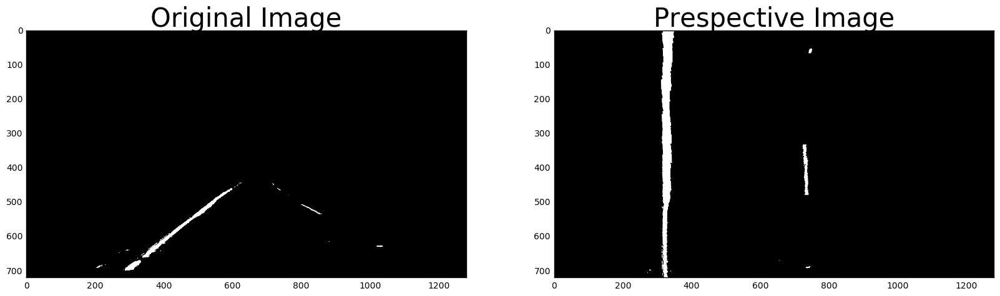

In [87]:
binary_warped, M, Minv = apply_perspective(masked_image)

# Visualize
plot_original_and_newImage(masked_image, binary_warped, 'Prespective Image')

/Users/saurabhsood/AnacondaPython3.5/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:1: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


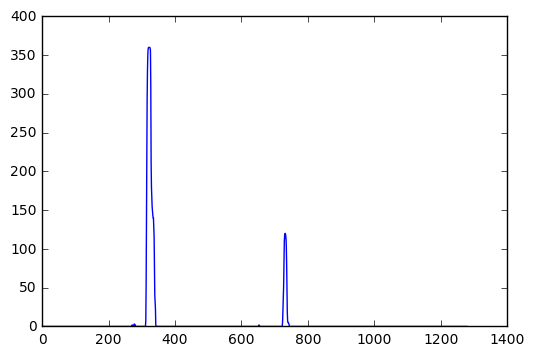

In [88]:
histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
plt.plot(histogram)

/Users/saurabhsood/AnacondaPython3.5/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


right_curverad= 1739.33584668
71336.0765584 5320.08855275


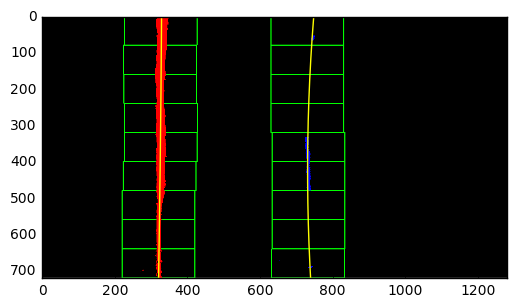

In [89]:
return_poly = fit_poly(binary_warped)

if return_poly == None:
    print("No Object Returned")
    right_curverad = None
    left_fit = None
    right_fit = None
    out_img = None
    left_lane_inds = None
    right_lane_inds = None
else:
    left_curverad = return_poly[0]
    right_curverad = return_poly[1]
    left_fit = return_poly[2]
    right_fit = return_poly[3]
    out_img = return_poly[4]
    left_lane_inds = return_poly[5]
    right_lane_inds = return_poly[6]
    
    print("right_curverad=", right_curverad)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    print(left_curverad, right_curverad)
    # Example values: 1926.74 1908.48

    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

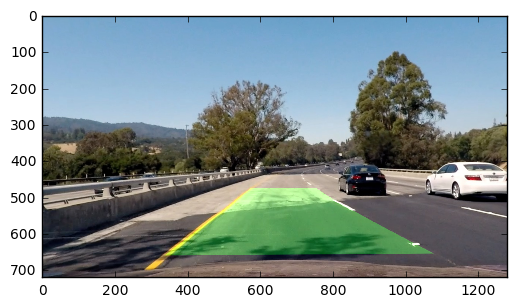

In [90]:
#plt.imshow(binary_warped, 'gray')
#plt.imshow(image, 'gray')
result = unwarp_image(image, binary_warped, Minv, left_fitx, right_fitx, ploty)
plt.imshow(result)

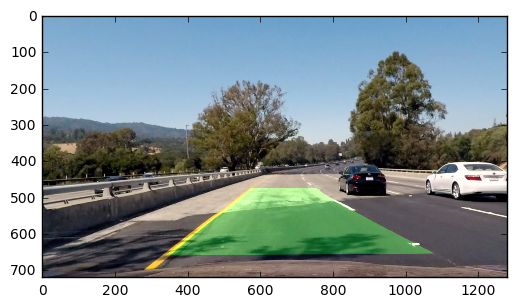

In [100]:
process_clip_result = process_clip(image)
plt.imshow(process_clip_result)

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML
 
#print("White 1")
last_saved_clip = None
project_video_output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_clip) #NOTE: this function expects color images!!
%time white_clip.write_videofile(project_video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


  6%|▌         | 72/1261 [00:05<01:49, 10.90it/s]

arg_max_left= 314 arg_max_right= 0
No Object Returned


 12%|█▏        | 146/1261 [00:11<01:48, 10.25it/s]

arg_max_left= 324 arg_max_right= 0
No Object Returned


 14%|█▎        | 171/1261 [00:14<02:38,  6.87it/s]

arg_max_left= 312 arg_max_right= 0
No Object Returned


 16%|█▋        | 208/1261 [00:18<01:51,  9.41it/s]

arg_max_left= 313 arg_max_right= 0
No Object Returned


 19%|█▉        | 244/1261 [00:21<01:24, 12.06it/s]

arg_max_left= 295 arg_max_right= 37
No Object Returned
arg_max_left= 295 arg_max_right= 40
No Object Returned


 20%|██        | 258/1261 [00:22<01:44,  9.57it/s]

arg_max_left= 295 arg_max_right= 39
No Object Returned


 24%|██▍       | 306/1261 [00:26<01:31, 10.40it/s]

arg_max_left= 308 arg_max_right= 0
No Object Returned


 27%|██▋       | 342/1261 [00:29<01:28, 10.41it/s]

arg_max_left= 319 arg_max_right= 0
No Object Returned


 28%|██▊       | 354/1261 [00:30<01:26, 10.50it/s]

arg_max_left= 315 arg_max_right= 0
No Object Returned


 32%|███▏      | 400/1261 [00:34<01:12, 11.84it/s]

arg_max_left= 309 arg_max_right= 0
No Object Returned


 35%|███▍      | 438/1261 [00:38<01:21, 10.12it/s]

arg_max_left= 296 arg_max_right= 0
No Object Returned


 36%|███▌      | 454/1261 [00:39<01:04, 12.52it/s]